In [1]:
import numpy as np
from scipy import misc, fft as scipy_fft
from matplotlib import pyplot, colors, cm
from tqdm.notebook import tqdm

colors.get_named_colors_mapping().update({
    'lfd:signal': "#f28e2b",
    'lfd:a': "#4e79a7",
    'lfd:b': "#59a14f",
    'lfd:retina': "#e15759",
    'lfd:pupil': "#edc948",
})

def sampling_coordinates(n, s):
    return (np.arange(n) - (n-1)/2) * s/n

def evaluate(x, xi, amplitudes, phases):
    return np.sum(amplitudes * np.cos(2.0 * np.pi * xi * x[:, np.newaxis] + phases), axis=-1)

def spatial_display_to_eye(x_a, x_b, z_a, z_b, z_r, z_f):
    x_r = (1 - z_b/z_f) * z_r/(z_a - z_b) * x_a + (1 - z_a/z_f) * z_r/(z_b - z_a) * x_b
    x_p = z_b/(z_b - z_a) * x_a + xi_r + z_a/(z_a - z_b) * x_b
    return x_r, x_p

def spatial_eye_to_display(x_r, x_p, z_a, z_b, z_r, z_f):
    x_a = (z_a/z_r) * x_r + (1 - z_a/z_f) * x_p
    x_b = (z_b/z_r) * x_r + (1 - z_b/z_f) * x_p
    return x_a, x_b

def frequency_display_to_eye(xi_a, xi_b, z_a, z_b, z_r, z_f):
    xi_r = (z_a/z_r) * xi_a + (z_b/z_r) * xi_b
    xi_p = (1 - z_a/z_f) * xi_a + (1 - z_b/z_f) * xi_b
    return xi_r, xi_p

def frequency_eye_to_display(xi_r, xi_p, z_a, z_b, z_r, z_f):
    xi_a = (1 - z_b/z_f) * z_r/(z_a - z_b) * xi_r + z_b/(z_b - z_a) * xi_p
    xi_b = (1 - z_a/z_f) * z_r/(z_b - z_a) * xi_r + z_a/(z_a - z_b) * xi_p

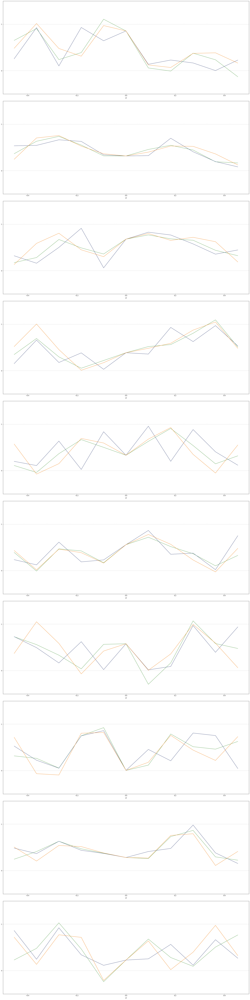

In [2]:
n = 11
s_r = 1.0
s_d = 1.4

x_plot_size = 2.0
xi_plot_size = 10.0

plot_resolution = 2048

x = sampling_coordinates(plot_resolution, x_plot_size)

x_r = sampling_coordinates(n, s_r)
x_d = sampling_coordinates(n, s_d)

xi_r = sampling_coordinates(n, n/s_r)
xi_d = sampling_coordinates(n, n/s_d)

fig, axs = pyplot.subplots(10, constrained_layout=True, figsize=(24, 96))

for index in range(10):
    values_r = np.random.sample(n)
    spectrum_r = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_r)))/n
    amplitudes_r = np.abs(spectrum_r)
    phases_r = np.angle(spectrum_r)

    values_d_post = evaluate(x_d, xi_r, amplitudes_r, phases_r)
    spectrum_d_post = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_d_post)))/n
    amplitudes_d_post = np.abs(spectrum_d_post)
    phases_d_post = np.angle(spectrum_d_post)

    even_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(evaluate(x_r, xi_d[n//2:, np.newaxis, np.newaxis], 1.0, 0.0), axes=-1), axis=-1)/n
    odd_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(evaluate(x_r, xi_d[n//2+1:, np.newaxis, np.newaxis], 1.0, np.pi/2), axes=-1), axis=-1)/n

    matrix = np.vstack((even_spectrum, odd_spectrum))
    matrix = np.hstack((np.real(matrix), np.imag(matrix[:, 1:])))

    output_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(values_r))/n
    output_spectrum = np.hstack((np.real(output_spectrum), np.imag(output_spectrum[1:])))

    input_spectrum = np.linalg.solve(matrix.T, output_spectrum)
    input_spectrum = input_spectrum[:n//2+1] + 1j * np.insert(input_spectrum[n//2+1:], 0, 0)
    input_spectrum = np.hstack((np.conjugate(np.flip(input_spectrum[1:]))/2, input_spectrum[0:1], input_spectrum[1:]/2))

    amplitudes_d_pre = np.abs(input_spectrum)
    phases_d_pre = np.angle(input_spectrum)

    values_d_pre = evaluate(x_d, xi_d, amplitudes_d_pre, phases_d_pre)
    values_d_pre_clipped = np.clip(values_d_pre, 0.0, 1.0)

    spectrum_d_pre_clipped = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_d_pre_clipped)))/n
    amplitudes_d_pre_clipped = np.abs(spectrum_d_pre_clipped)
    phases_d_pre_clipped = np.angle(spectrum_d_pre_clipped)

    axs[index].set_xlabel(r'$x$', fontsize=14)
    axs[index].set_yticks([0.0, 1.0])
    axs[index].set_ylim(-0.5, 1.5)
    axs[index].hlines([0.0, 1.0], -x_plot_size/2, x_plot_size/2, linestyle='dashed', color='lightgrey', zorder=-1)
    axs[index].set_xlim(-s_r/2, s_r/2)
    
    axs[index].plot(x_r, values_r, color='lfd:retina')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_post, phases_d_post), color='lfd:b')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_pre, phases_d_pre), color='lfd:a')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_pre_clipped, phases_d_pre_clipped), color='lfd:signal')

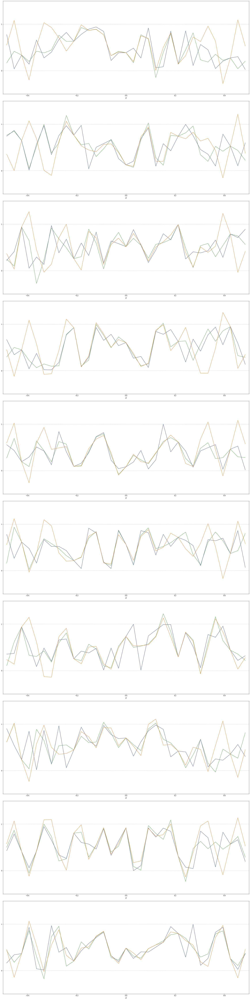

In [3]:
n = 33
s_r = 1.0
s_d = 1.4

x_plot_size = 2.0
xi_plot_size = 10.0

plot_resolution = 2048

x = sampling_coordinates(plot_resolution, x_plot_size)

x_r = sampling_coordinates(n, s_r)
x_d = sampling_coordinates(n, s_d)

xi_r = sampling_coordinates(n, n/s_r)
xi_d = sampling_coordinates(n, n/s_d)

fig, axs = pyplot.subplots(10, constrained_layout=True, figsize=(24, 96))

for index in range(10):
    values_r = np.random.sample(n)
    spectrum_r = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_r)))/n
    amplitudes_r = np.abs(spectrum_r)
    phases_r = np.angle(spectrum_r)

    values_d_post = evaluate(x_d, xi_r, amplitudes_r, phases_r)
    spectrum_d_post = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_d_post)))/n
    amplitudes_d_post = np.abs(spectrum_d_post)
    phases_d_post = np.angle(spectrum_d_post)

    even_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(evaluate(x_r, xi_d[n//2:, np.newaxis, np.newaxis], 1.0, 0.0), axes=-1), axis=-1)/n
    odd_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(evaluate(x_r, xi_d[n//2+1:, np.newaxis, np.newaxis], 1.0, np.pi/2), axes=-1), axis=-1)/n

    matrix = np.vstack((even_spectrum, odd_spectrum))
    matrix = np.hstack((np.real(matrix), np.imag(matrix[:, 1:])))

    output_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(values_r))/n
    output_spectrum = np.hstack((np.real(output_spectrum), np.imag(output_spectrum[1:])))

    input_spectrum = np.linalg.solve(matrix.T, output_spectrum)
    input_spectrum = input_spectrum[:n//2+1] + 1j * np.insert(input_spectrum[n//2+1:], 0, 0)
    input_spectrum = np.hstack((np.conjugate(np.flip(input_spectrum[1:]))/2, input_spectrum[0:1], input_spectrum[1:]/2))

    amplitudes_d_pre = np.abs(input_spectrum)
    phases_d_pre = np.angle(input_spectrum)

    values_d_pre = evaluate(x_d, xi_d, amplitudes_d_pre, phases_d_pre)
    values_d_pre_clipped = np.clip(values_d_pre, 0.0, 1.0)

    spectrum_d_pre_clipped = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_d_pre_clipped)))/n
    amplitudes_d_pre_clipped = np.abs(spectrum_d_pre_clipped)
    phases_d_pre_clipped = np.angle(spectrum_d_pre_clipped)

    axs[index].set_xlabel(r'$x$', fontsize=14)
    axs[index].set_yticks([0.0, 1.0])
    axs[index].set_ylim(-0.5, 1.5)
    axs[index].hlines([0.0, 1.0], -x_plot_size/2, x_plot_size/2, linestyle='dashed', color='lightgrey', zorder=-1)
    axs[index].set_xlim(-s_r/2, s_r/2)
    
    axs[index].plot(x_r, values_r, color='lfd:retina')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_post, phases_d_post), color='lfd:b')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_pre, phases_d_pre), color='lfd:a')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_pre_clipped, phases_d_pre_clipped), color='lfd:signal')

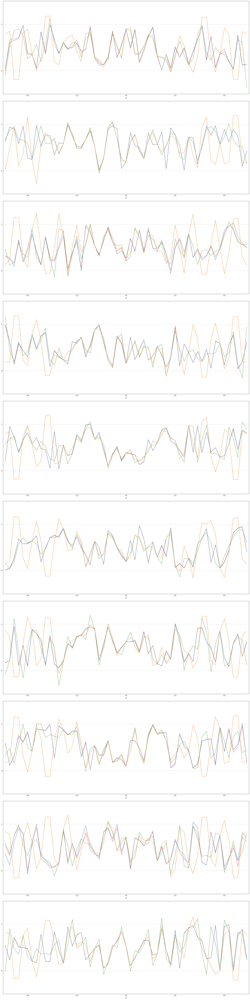

In [4]:
n = 55
s_r = 1.0
s_d = 1.4

x_plot_size = 2.0
xi_plot_size = 10.0

plot_resolution = 2048

x = sampling_coordinates(plot_resolution, x_plot_size)

x_r = sampling_coordinates(n, s_r)
x_d = sampling_coordinates(n, s_d)

xi_r = sampling_coordinates(n, n/s_r)
xi_d = sampling_coordinates(n, n/s_d)

fig, axs = pyplot.subplots(10, constrained_layout=True, figsize=(24, 96))

for index in range(10):
    values_r = np.random.sample(n)
    spectrum_r = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_r)))/n
    amplitudes_r = np.abs(spectrum_r)
    phases_r = np.angle(spectrum_r)

    values_d_post = evaluate(x_d, xi_r, amplitudes_r, phases_r)
    spectrum_d_post = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_d_post)))/n
    amplitudes_d_post = np.abs(spectrum_d_post)
    phases_d_post = np.angle(spectrum_d_post)

    even_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(evaluate(x_r, xi_d[n//2:, np.newaxis, np.newaxis], 1.0, 0.0), axes=-1), axis=-1)/n
    odd_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(evaluate(x_r, xi_d[n//2+1:, np.newaxis, np.newaxis], 1.0, np.pi/2), axes=-1), axis=-1)/n

    matrix = np.vstack((even_spectrum, odd_spectrum))
    matrix = np.hstack((np.real(matrix), np.imag(matrix[:, 1:])))

    output_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(values_r))/n
    output_spectrum = np.hstack((np.real(output_spectrum), np.imag(output_spectrum[1:])))

    input_spectrum = np.linalg.solve(matrix.T, output_spectrum)
    input_spectrum = input_spectrum[:n//2+1] + 1j * np.insert(input_spectrum[n//2+1:], 0, 0)
    input_spectrum = np.hstack((np.conjugate(np.flip(input_spectrum[1:]))/2, input_spectrum[0:1], input_spectrum[1:]/2))

    amplitudes_d_pre = np.abs(input_spectrum)
    phases_d_pre = np.angle(input_spectrum)

    values_d_pre = evaluate(x_d, xi_d, amplitudes_d_pre, phases_d_pre)
    values_d_pre_clipped = np.clip(values_d_pre, 0.0, 1.0)

    spectrum_d_pre_clipped = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_d_pre_clipped)))/n
    amplitudes_d_pre_clipped = np.abs(spectrum_d_pre_clipped)
    phases_d_pre_clipped = np.angle(spectrum_d_pre_clipped)

    axs[index].set_xlabel(r'$x$', fontsize=14)
    axs[index].set_yticks([0.0, 1.0])
    axs[index].set_ylim(-0.5, 1.5)
    axs[index].hlines([0.0, 1.0], -x_plot_size/2, x_plot_size/2, linestyle='dashed', color='lightgrey', zorder=-1)
    axs[index].set_xlim(-s_r/2, s_r/2)
    
    axs[index].plot(x_r, values_r, color='lfd:retina')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_post, phases_d_post), color='lfd:b')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_pre, phases_d_pre), color='lfd:a')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_pre_clipped, phases_d_pre_clipped), color='lfd:signal')

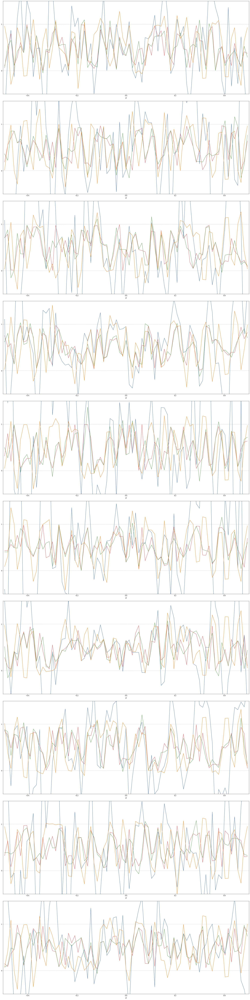

In [5]:
n = 77
s_r = 1.0
s_d = 1.4

x_plot_size = 2.0
xi_plot_size = 10.0

plot_resolution = 2048

x = sampling_coordinates(plot_resolution, x_plot_size)

x_r = sampling_coordinates(n, s_r)
x_d = sampling_coordinates(n, s_d)

xi_r = sampling_coordinates(n, n/s_r)
xi_d = sampling_coordinates(n, n/s_d)

fig, axs = pyplot.subplots(10, constrained_layout=True, figsize=(24, 96))

for index in range(10):
    values_r = np.random.sample(n)
    spectrum_r = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_r)))/n
    amplitudes_r = np.abs(spectrum_r)
    phases_r = np.angle(spectrum_r)

    values_d_post = evaluate(x_d, xi_r, amplitudes_r, phases_r)
    spectrum_d_post = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_d_post)))/n
    amplitudes_d_post = np.abs(spectrum_d_post)
    phases_d_post = np.angle(spectrum_d_post)

    even_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(evaluate(x_r, xi_d[n//2:, np.newaxis, np.newaxis], 1.0, 0.0), axes=-1), axis=-1)/n
    odd_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(evaluate(x_r, xi_d[n//2+1:, np.newaxis, np.newaxis], 1.0, np.pi/2), axes=-1), axis=-1)/n

    matrix = np.vstack((even_spectrum, odd_spectrum))
    matrix = np.hstack((np.real(matrix), np.imag(matrix[:, 1:])))

    output_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(values_r))/n
    output_spectrum = np.hstack((np.real(output_spectrum), np.imag(output_spectrum[1:])))

    input_spectrum = np.linalg.solve(matrix.T, output_spectrum)
    input_spectrum = input_spectrum[:n//2+1] + 1j * np.insert(input_spectrum[n//2+1:], 0, 0)
    input_spectrum = np.hstack((np.conjugate(np.flip(input_spectrum[1:]))/2, input_spectrum[0:1], input_spectrum[1:]/2))

    amplitudes_d_pre = np.abs(input_spectrum)
    phases_d_pre = np.angle(input_spectrum)

    values_d_pre = evaluate(x_d, xi_d, amplitudes_d_pre, phases_d_pre)
    values_d_pre_clipped = np.clip(values_d_pre, 0.0, 1.0)

    spectrum_d_pre_clipped = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_d_pre_clipped)))/n
    amplitudes_d_pre_clipped = np.abs(spectrum_d_pre_clipped)
    phases_d_pre_clipped = np.angle(spectrum_d_pre_clipped)

    axs[index].set_xlabel(r'$x$', fontsize=14)
    axs[index].set_yticks([0.0, 1.0])
    axs[index].set_ylim(-0.5, 1.5)
    axs[index].hlines([0.0, 1.0], -x_plot_size/2, x_plot_size/2, linestyle='dashed', color='lightgrey', zorder=-1)
    axs[index].set_xlim(-s_r/2, s_r/2)
    
    axs[index].plot(x_r, values_r, color='lfd:retina')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_post, phases_d_post), color='lfd:b')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_pre, phases_d_pre), color='lfd:a')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_pre_clipped, phases_d_pre_clipped), color='lfd:signal')

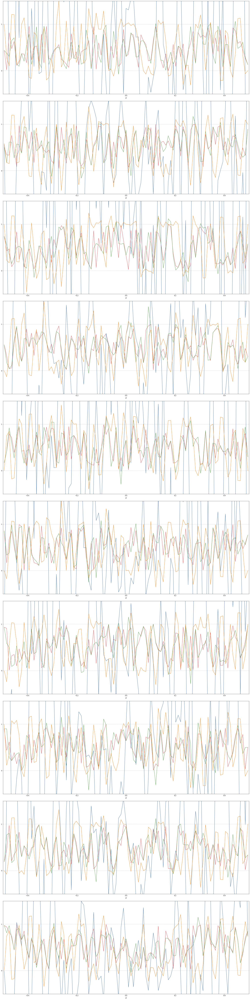

In [6]:
n = 99
s_r = 1.0
s_d = 1.4

x_plot_size = 2.0
xi_plot_size = 10.0

plot_resolution = 2048

x = sampling_coordinates(plot_resolution, x_plot_size)

x_r = sampling_coordinates(n, s_r)
x_d = sampling_coordinates(n, s_d)

xi_r = sampling_coordinates(n, n/s_r)
xi_d = sampling_coordinates(n, n/s_d)

fig, axs = pyplot.subplots(10, constrained_layout=True, figsize=(24, 96))

for index in range(10):
    values_r = np.random.sample(n)
    spectrum_r = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_r)))/n
    amplitudes_r = np.abs(spectrum_r)
    phases_r = np.angle(spectrum_r)

    values_d_post = evaluate(x_d, xi_r, amplitudes_r, phases_r)
    spectrum_d_post = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_d_post)))/n
    amplitudes_d_post = np.abs(spectrum_d_post)
    phases_d_post = np.angle(spectrum_d_post)

    even_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(evaluate(x_r, xi_d[n//2:, np.newaxis, np.newaxis], 1.0, 0.0), axes=-1), axis=-1)/n
    odd_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(evaluate(x_r, xi_d[n//2+1:, np.newaxis, np.newaxis], 1.0, np.pi/2), axes=-1), axis=-1)/n

    matrix = np.vstack((even_spectrum, odd_spectrum))
    matrix = np.hstack((np.real(matrix), np.imag(matrix[:, 1:])))

    output_spectrum = scipy_fft.rfft(scipy_fft.ifftshift(values_r))/n
    output_spectrum = np.hstack((np.real(output_spectrum), np.imag(output_spectrum[1:])))

    input_spectrum = np.linalg.solve(matrix.T, output_spectrum)
    input_spectrum = input_spectrum[:n//2+1] + 1j * np.insert(input_spectrum[n//2+1:], 0, 0)
    input_spectrum = np.hstack((np.conjugate(np.flip(input_spectrum[1:]))/2, input_spectrum[0:1], input_spectrum[1:]/2))

    amplitudes_d_pre = np.abs(input_spectrum)
    phases_d_pre = np.angle(input_spectrum)

    values_d_pre = evaluate(x_d, xi_d, amplitudes_d_pre, phases_d_pre)
    values_d_pre_clipped = np.clip(values_d_pre, 0.0, 1.0)

    spectrum_d_pre_clipped = scipy_fft.fftshift(scipy_fft.fft(scipy_fft.ifftshift(values_d_pre_clipped)))/n
    amplitudes_d_pre_clipped = np.abs(spectrum_d_pre_clipped)
    phases_d_pre_clipped = np.angle(spectrum_d_pre_clipped)

    axs[index].set_xlabel(r'$x$', fontsize=14)
    axs[index].set_yticks([0.0, 1.0])
    axs[index].set_ylim(-0.5, 1.5)
    axs[index].hlines([0.0, 1.0], -x_plot_size/2, x_plot_size/2, linestyle='dashed', color='lightgrey', zorder=-1)
    axs[index].set_xlim(-s_r/2, s_r/2)
    
    axs[index].plot(x_r, values_r, color='lfd:retina')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_post, phases_d_post), color='lfd:b')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_pre, phases_d_pre), color='lfd:a')
    axs[index].plot(x_r, evaluate(x_r, xi_d, amplitudes_d_pre_clipped, phases_d_pre_clipped), color='lfd:signal')